# 1. Default Structure

In [ ]:
import os
import re
from dataclasses import dataclass
from typing import Optional, List, Dict
from pathlib import Path
from PIL import Image
import matplotlib.pyplot as plt
from tqdm import tqdm


@dataclass
class ImageData:
    """Class to store parsed image data"""
    artwork: str          # e.g., "pixiv1"
    model: str            # e.g., "nbp-base" or "original"
    page_number: int      # e.g., 0, 1, 2, ...
    inference_time: Optional[float]  # e.g., 38.0 (None for original images)
    img: Image.Image      # PIL Image
    filepath: str         # Full path to the image
    
    def __repr__(self):
        return f"ImageData(artwork={self.artwork}, model={self.model}, page={self.page_number}, inference_time={self.inference_time})"


class ImageLoader:
    """Load and parse images from data directory"""
    
    # Pattern to extract page number from filename (flexible with underscore separation)
    # Matches patterns like: p0, p1, p10, etc. anywhere in underscore-separated parts
    PAGE_PATTERN = re.compile(r'p(\d+)')
    
    # Pattern to extract inference time (e.g., 38s, 45s)
    INFERENCE_PATTERN = re.compile(r'(\d+(?:\.\d+)?)s')
    
    def __init__(self, data_dir: str):
        """
        Initialize the loader with the data directory path.
        
        Args:
            data_dir: Path to the data directory (e.g., "data/")
        """
        self.data_dir = Path(data_dir)
        self.images: List[ImageData] = []
        
    def load_all(self) -> List[ImageData]:
        """Load all images from the data directory"""
        self.images = []
        
        if not self.data_dir.exists():
            raise ValueError(f"Data directory not found: {self.data_dir}")
        
        # Iterate through artwork folders (e.g., pixiv1)
        for artwork_dir in tqdm(self.data_dir.iterdir(), desc="Loading artworks"):
            if not artwork_dir.is_dir() or artwork_dir.name.startswith('.'):
                continue
                
            artwork_name = artwork_dir.name
            
            # Iterate through model folders (e.g., nbp-base, original)
            for model_dir in artwork_dir.iterdir():
                if not model_dir.is_dir() or model_dir.name.startswith('.'):
                    continue
                    
                model_name = model_dir.name
                
                # Load all images in the model folder
                for img_file in model_dir.iterdir():
                    if img_file.suffix.lower() in ['.png', '.jpg', '.jpeg', '.webp']:
                        image_data = self._parse_image(img_file, artwork_name, model_name)
                        if image_data:
                            self.images.append(image_data)
        
        return self.images
    
    def _parse_image(self, filepath: Path, artwork: str, model: str) -> Optional[ImageData]:
        """Parse a single image file and extract metadata"""
        filename = filepath.stem  # filename without extension
        
        # Split by underscore for flexible parsing
        parts = filename.split('_')
        
        # Find page number from any part
        page_number = None
        for part in parts:
            match = self.PAGE_PATTERN.search(part)
            if match:
                page_number = int(match.group(1))
                break
        
        if page_number is None:
            print(f"Warning: Could not parse page number from {filepath}")
            return None
        
        # Find inference time (optional)
        inference_time = None
        for part in parts:
            match = self.INFERENCE_PATTERN.search(part)
            if match:
                inference_time = float(match.group(1))
                break
        
        # Load the image
        try:
            img = Image.open(filepath)
            img.load()  # Force load to catch any issues
        except Exception as e:
            print(f"Warning: Could not load image {filepath}: {e}")
            return None
        
        return ImageData(
            artwork=artwork,
            model=model,
            page_number=page_number,
            inference_time=inference_time,
            img=img,
            filepath=str(filepath)
        )
    
    def get_by_artwork(self, artwork: str) -> List[ImageData]:
        """Get all images for a specific artwork"""
        return [img for img in self.images if img.artwork == artwork]
    
    def get_by_model(self, model: str) -> List[ImageData]:
        """Get all images for a specific model"""
        return [img for img in self.images if img.model == model]
    
    def get_by_artwork_and_model(self, artwork: str, model: str) -> List[ImageData]:
        """Get all images for a specific artwork and model"""
        return [img for img in self.images if img.artwork == artwork and img.model == model]
    
    def get_artworks(self) -> List[str]:
        """Get list of all artwork names"""
        return list(set(img.artwork for img in self.images))
    
    def get_models(self, artwork: Optional[str] = None) -> List[str]:
        """Get list of all model names, optionally filtered by artwork"""
        if artwork:
            return list(set(img.model for img in self.images if img.artwork == artwork))
        return list(set(img.model for img in self.images))

In [18]:
# Load all images from data directory
loader = ImageLoader("data/")
loader.load_all()

# Show summary
print(f"Loaded {len(loader.images)} images")
print(f"Artworks: {loader.get_artworks()}")
print(f"Models: {loader.get_models()}")

# Show first few images info
for img in loader.images[:5]:
    print(img)

/Users/jzahnny/code/yonsei/deeplearning/colorization/python/.venv/lib/python3.11/site-packages/PIL/Image.py:3432: DecompressionBombWarning: Image size (161217300 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


Loaded 123 images
Artworks: ['pixiv2', 'pixiv1']
Models: ['nbp-base-kr', 'merged_22', 'merged__31', 'nbp-base', 'manganinja', 'merged_33', 'merged_nbp-base_31', 'merged_nbp-base_13', 'original', 'manana_ct_b5', 'merged_55', 'merged_nbp-base_33', 'merged__21']
ImageData(artwork=pixiv2, model=original, page=7, inference_time=None)
ImageData(artwork=pixiv2, model=original, page=6, inference_time=None)
ImageData(artwork=pixiv2, model=original, page=4, inference_time=None)
ImageData(artwork=pixiv2, model=original, page=5, inference_time=None)
ImageData(artwork=pixiv2, model=original, page=1, inference_time=None)


# 2. Functions

## 2.1. `display_2col`

In [25]:
def display_2col(loader: ImageLoader, artwork: str, model1: str, model2: str, save_path: str = None, figsize: tuple = (12, 8)):
    """
    Display images side-by-side for comparison between two models.
    
    Args:
        loader: ImageLoader instance with loaded images
        artwork: Artwork name (e.g., "pixiv1")
        model1: First model name (displayed on left)
        model2: Second model name (displayed on right)
        figsize: Figure size for each comparison (width, height)
    """
    # Get images for both models
    images1 = loader.get_by_artwork_and_model(artwork, model1)
    images2 = loader.get_by_artwork_and_model(artwork, model2)
    
    # Create dictionaries by page number for easy lookup
    dict1: Dict[int, ImageData] = {img.page_number: img for img in images1}
    dict2: Dict[int, ImageData] = {img.page_number: img for img in images2}
    
    # Get all page numbers that exist in either model
    all_pages = sorted(set(dict1.keys()) | set(dict2.keys()))
    
    if not all_pages:
        print(f"No images found for artwork '{artwork}' with models '{model1}' or '{model2}'")
        return
    
    print(f"Comparing {len(all_pages)} pages for artwork '{artwork}'")
    print(f"Left: {model1} | Right: {model2}")
    print("-" * 50)
    
    # Display each page comparison
    for page in all_pages:
        fig, axes = plt.subplots(1, 2, figsize=figsize)
        
        # Left image (model1)
        if page in dict1:
            img_data1 = dict1[page]
            axes[0].imshow(img_data1.img)
            title1 = f"{model1} - Page {page}"
            if img_data1.inference_time is not None:
                title1 += f" ({img_data1.inference_time}s)"
            axes[0].set_title(title1)
        else:
            axes[0].text(0.5, 0.5, f"No image\n{model1} - Page {page}", 
                        ha='center', va='center', fontsize=14)
            axes[0].set_title(f"{model1} - Page {page} (missing)")
        axes[0].axis('off')
        
        # Right image (model2)
        if page in dict2:
            img_data2 = dict2[page]
            axes[1].imshow(img_data2.img)
            title2 = f"{model2} - Page {page}"
            if img_data2.inference_time is not None:
                title2 += f" ({img_data2.inference_time}s)"
            axes[1].set_title(title2)
        else:
            axes[1].text(0.5, 0.5, f"No image\n{model2} - Page {page}", 
                        ha='center', va='center', fontsize=14)
            axes[1].set_title(f"{model2} - Page {page} (missing)")
        axes[1].axis('off')
        
        plt.tight_layout()
        plt.show()

        # Save figure
        if save_path:
            os.makedirs(save_path, exist_ok=True)
            fig.savefig(f"{save_path}/p{page}.png")

Comparing 19 pages for artwork 'pixiv1'
Left: original | Right: manana_ct_b5
--------------------------------------------------


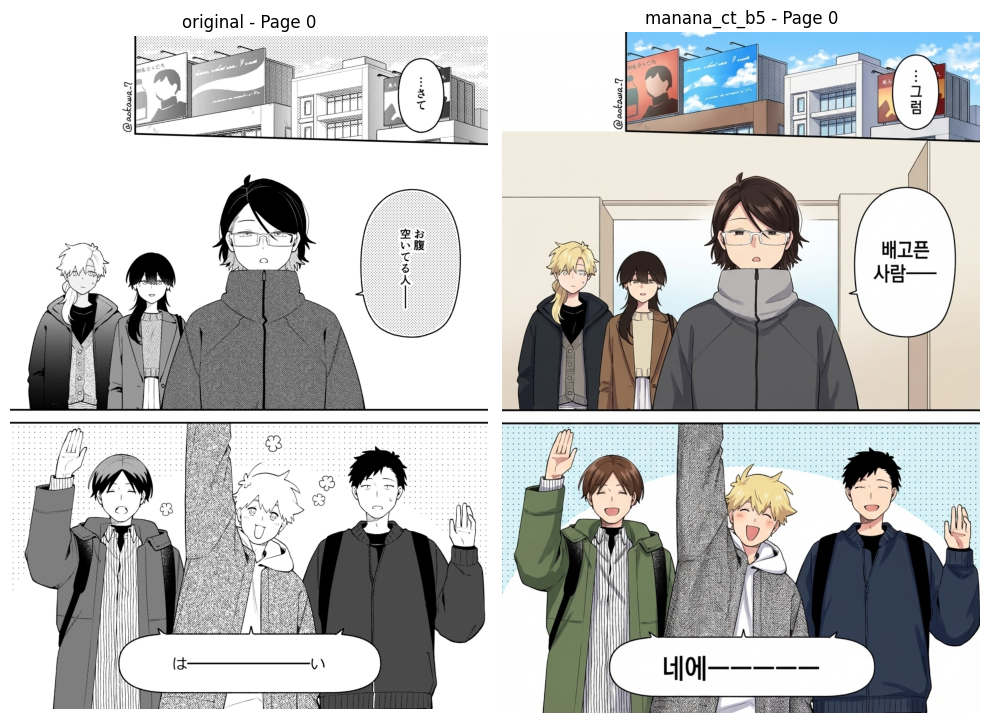

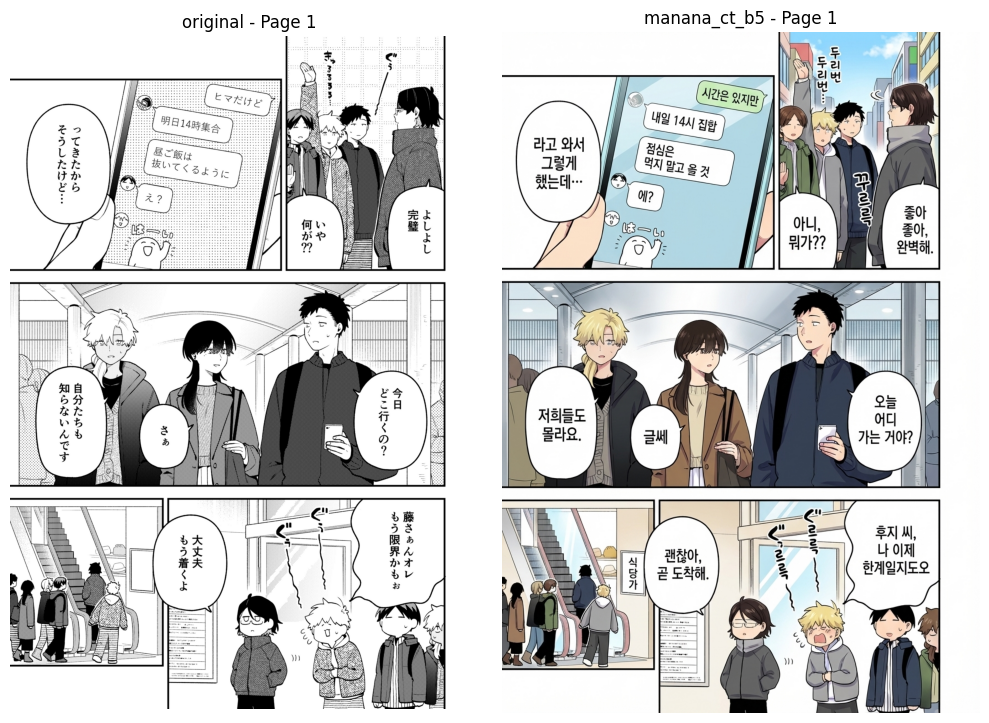

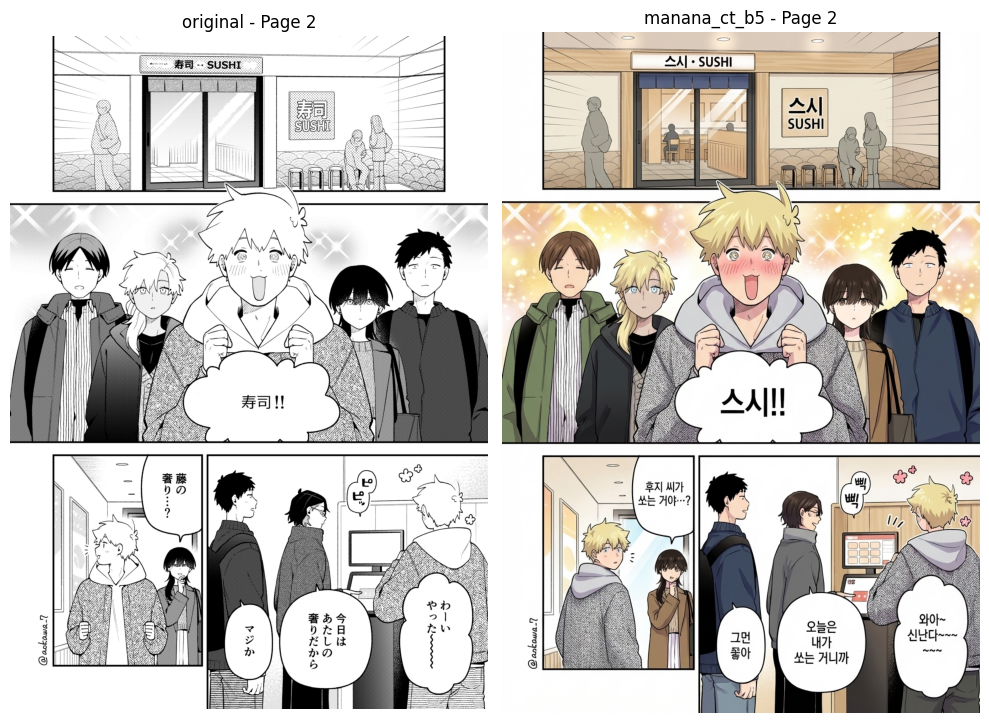

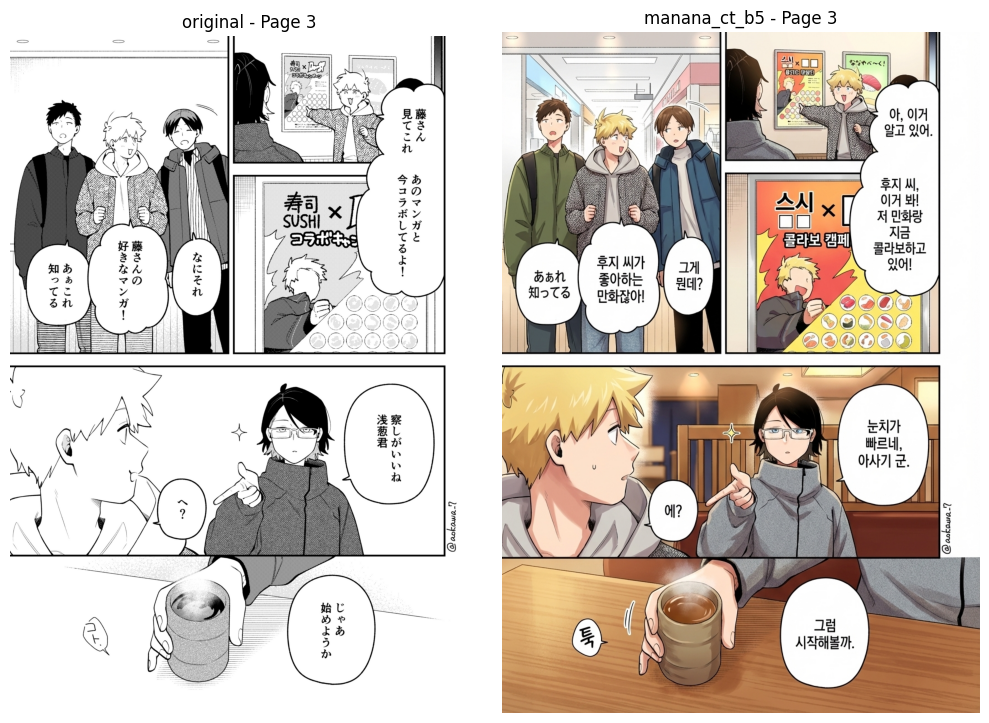

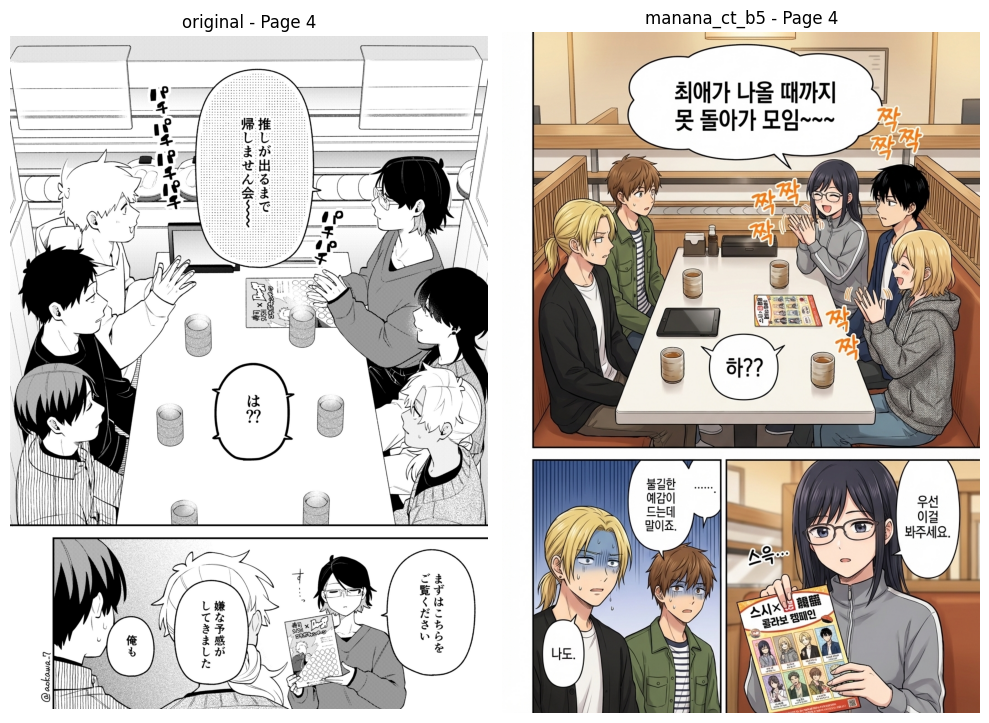

...

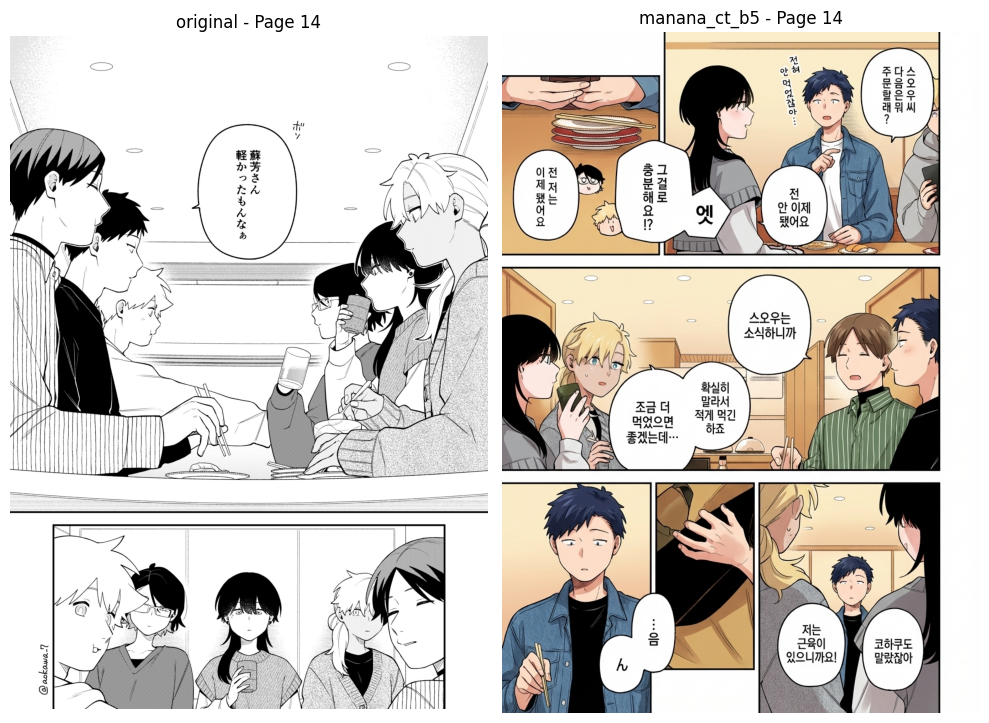

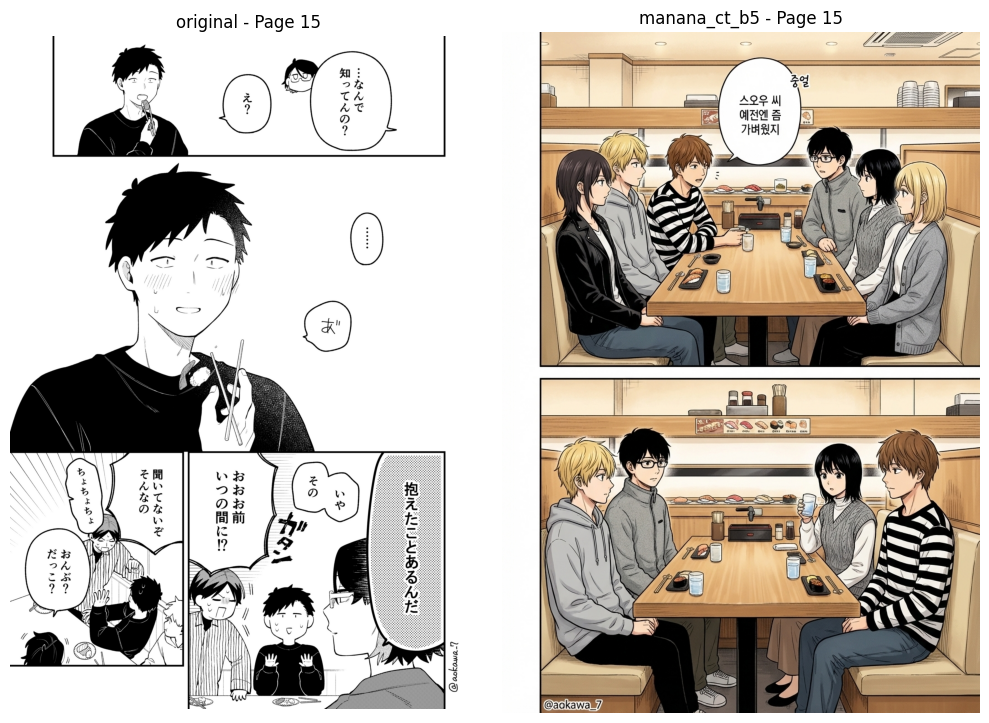

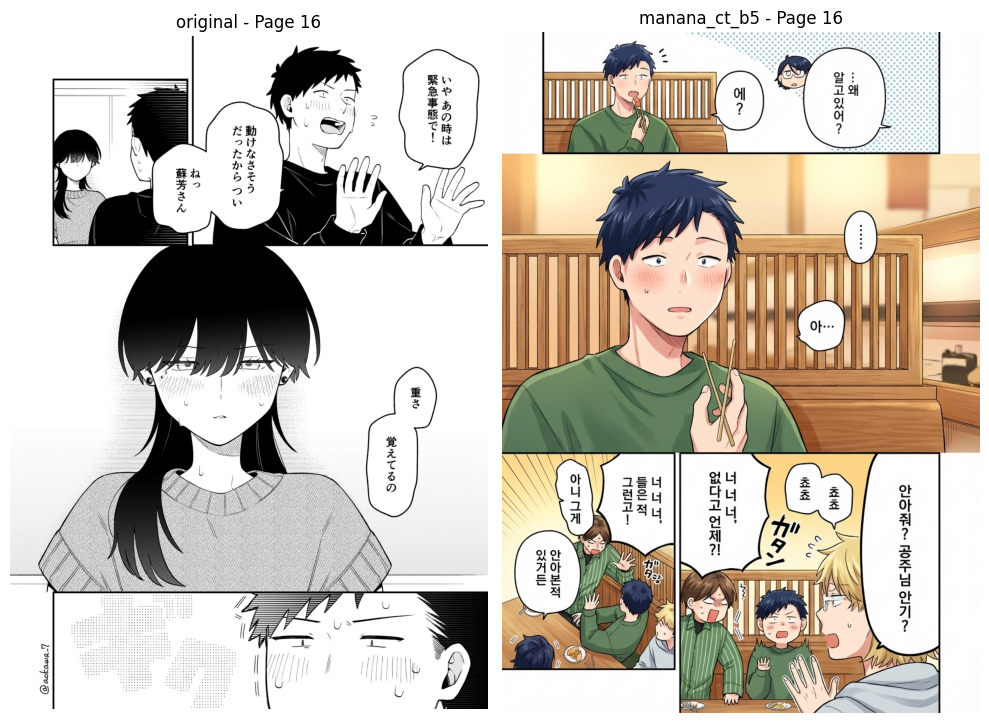

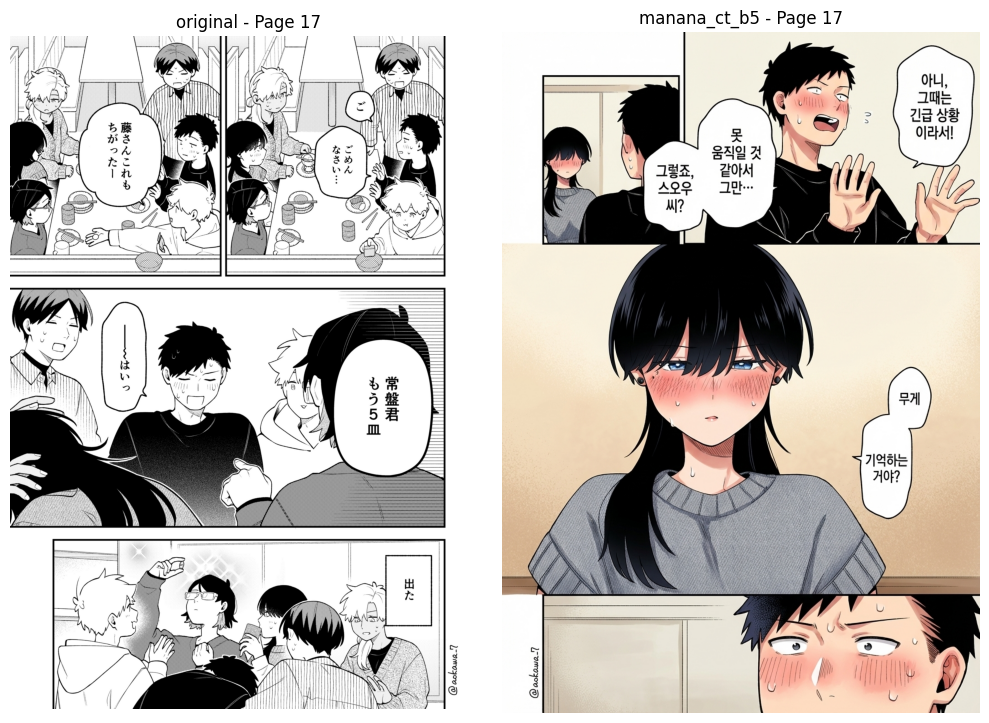

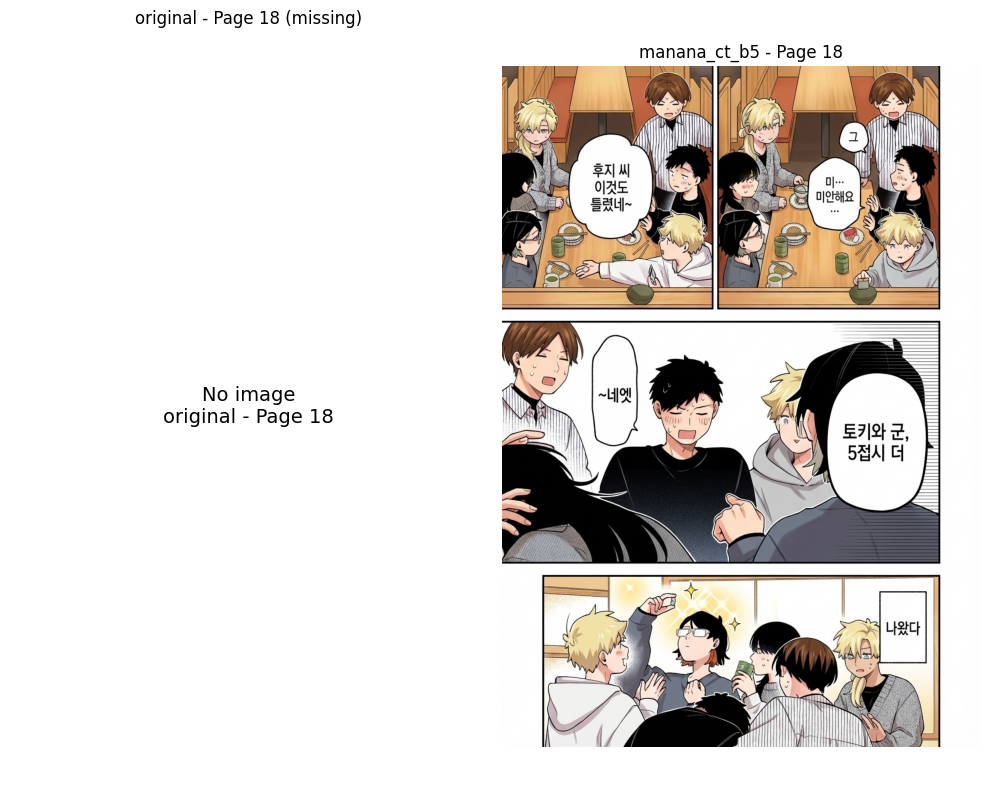

In [29]:
# Display side-by-side comparison of original vs nbp-base
display_2col(loader, "pixiv1", "original", "manana_ct_b5", save_path="data/pixiv1/original_vs_manana_ct_b5", figsize=(10, 8))

## 2.2. `merge_and_save`

In [2]:
def merge_and_save(loader: ImageLoader, artwork: str, input_model: str, n_col: int, n_row: int, output_model: str, border: int = 0):
    """
    Merge images into a grid and save to output folder.
    
    Args:
        loader: ImageLoader instance with loaded images
        artwork: Artwork name (e.g., "pixiv1")
        input_model: Source model name (e.g., "original")
        n_col: Number of columns in the grid
        n_row: Number of rows in the grid
        output_model: Output folder name (e.g., "merged_34")
        border: Border width in pixels (black border between images)
    
    Output files will be named like: p0~11.png, p12~23.png, etc.
    Images are placed left-to-right, top-to-bottom. Empty cells are filled with white (#ffffff).
    """
    # Get images for the artwork and model
    images = loader.get_by_artwork_and_model(artwork, input_model)
    
    if not images:
        print(f"No images found for artwork '{artwork}' with model '{input_model}'")
        return
    
    # Sort by page number
    images_dict: Dict[int, ImageData] = {img.page_number: img for img in images}
    all_pages = sorted(images_dict.keys())
    
    if not all_pages:
        print("No pages found")
        return
    
    # Get image dimensions from first image (assume all images are same size)
    first_img = images_dict[all_pages[0]].img
    img_width, img_height = first_img.size
    
    # Calculate grid dimensions with border
    grid_width = img_width * n_col + border * (n_col + 1)
    grid_height = img_height * n_row + border * (n_row + 1)
    images_per_grid = n_col * n_row
    
    # Create output directory
    output_dir = loader.data_dir / artwork / output_model
    output_dir.mkdir(parents=True, exist_ok=True)
    
    # Process pages in chunks
    min_page = min(all_pages)
    max_page = max(all_pages)
    
    grid_idx = 0
    current_page = min_page
    
    while current_page <= max_page:
        # Calculate page range for this grid
        start_page = current_page
        end_page = current_page + images_per_grid - 1
        
        # Create black canvas (for border)
        grid_img = Image.new('RGB', (grid_width, grid_height), color=(0, 0, 0))
        
        # Fill grid with images
        for i in range(images_per_grid):
            page_num = current_page + i
            
            # Calculate position in grid (left-to-right, top-to-bottom)
            col = i % n_col
            row = i // n_col
            x = border + col * (img_width + border)
            y = border + row * (img_height + border)
            
            # Paste image if it exists, otherwise paste white
            if page_num in images_dict:
                img = images_dict[page_num].img
                # Convert to RGB if necessary (handle RGBA, L, etc.)
                if img.mode != 'RGB':
                    img = img.convert('RGB')
                grid_img.paste(img, (x, y))
            else:
                # Fill empty cell with white
                white_cell = Image.new('RGB', (img_width, img_height), color=(255, 255, 255))
                grid_img.paste(white_cell, (x, y))
        
        # Save the grid
        actual_end = min(end_page, max_page)
        filename = f"p{start_page}~{actual_end}.png"
        output_path = output_dir / filename
        grid_img.save(output_path, 'PNG')
        print(f"Saved: {output_path}")
        
        current_page += images_per_grid
        grid_idx += 1
    
    print(f"\nDone! Saved {grid_idx} merged images to {output_dir}")

In [8]:
merge_and_save(loader, "pixiv1", "original", 2, 1, "merged__21", 10)

Saved: data/pixiv1/merged__21/p0~1.png
Saved: data/pixiv1/merged__21/p2~3.png
Saved: data/pixiv1/merged__21/p4~5.png
Saved: data/pixiv1/merged__21/p6~7.png
Saved: data/pixiv1/merged__21/p8~9.png
Saved: data/pixiv1/merged__21/p10~11.png
Saved: data/pixiv1/merged__21/p12~13.png
Saved: data/pixiv1/merged__21/p14~15.png
Saved: data/pixiv1/merged__21/p16~17.png

Done! Saved 9 merged images to data/pixiv1/merged__21


## 2.3. `plot_inference_time_chart`

In [19]:
def plot_inference_time_chart(loader: ImageLoader, artwork: str, model: str, figsize: tuple = (12, 6)):
    """
    Plot a bar chart of inference times by page number.
    
    Args:
        loader: ImageLoader instance with loaded images
        artwork: Artwork name (e.g., "pixiv1")
        model: Model name (e.g., "nbp-base")
        figsize: Figure size (width, height)
    """
    images = loader.get_by_artwork_and_model(artwork, model)
    
    if not images:
        print(f"No images found for artwork '{artwork}' with model '{model}'")
        return
    
    # Filter images with inference time and sort by page number
    images_with_time = [(img.page_number, img.inference_time) for img in images if img.inference_time is not None]
    
    if not images_with_time:
        print(f"No inference time data found for artwork '{artwork}' with model '{model}'")
        return
    
    images_with_time.sort(key=lambda x: x[0])
    
    pages = [x[0] for x in images_with_time]
    times = [x[1] for x in images_with_time]
    
    # Create bar chart
    fig, ax = plt.subplots(figsize=figsize)
    bars = ax.bar(pages, times, color='steelblue', edgecolor='black')
    
    ax.set_xlabel('Page Number', fontsize=12)
    ax.set_ylabel('Inference Time (s)', fontsize=12)
    ax.set_title(f'Inference Time per Page - {artwork} / {model}', fontsize=14)
    ax.set_xticks(pages)
    
    # Add value labels on top of bars
    for bar, time in zip(bars, times):
        ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.5, 
                f'{time:.0f}s', ha='center', va='bottom', fontsize=9)
    
    # Add average line
    avg_time = sum(times) / len(times)
    ax.axhline(y=avg_time, color='red', linestyle='--', label=f'Average: {avg_time:.1f}s')
    ax.legend()
    
    plt.tight_layout()
    plt.show()
    
    # Print summary
    print(f"Total pages: {len(times)}")
    print(f"Average inference time: {avg_time:.1f}s")
    print(f"Min: {min(times):.0f}s (Page {pages[times.index(min(times))]})")
    print(f"Max: {max(times):.0f}s (Page {pages[times.index(max(times))]})")

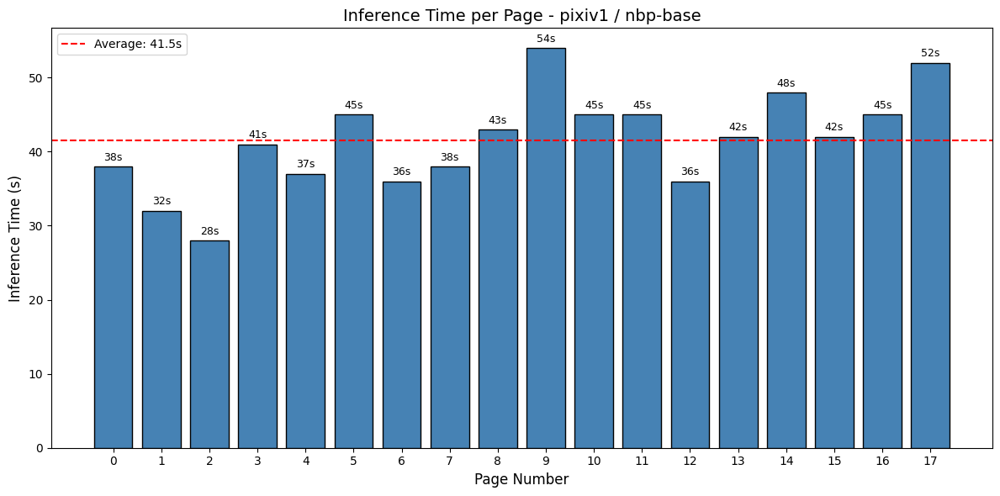

Total pages: 18
Average inference time: 41.5s
Min: 28s (Page 2)
Max: 54s (Page 9)


In [20]:
plot_inference_time_chart(loader, "pixiv1", "nbp-base")

## 2.4. Change file name

In [13]:
import os
import re
from pathlib import Path

def rename_decrease_page_number(directory: str, dry_run: bool = True):
    """
    Rename files by decreasing the page number (p{n}) by 1.
    
    Args:
        directory: Directory path containing files to rename
        dry_run: If True, only show what would be renamed without actually renaming
    
    Example:
        p0.png -> stays as p0.png (no change if already 0)
        p1.png -> p0.png
        p10_38s.png -> p9_38s.png
        p5~10.png -> p4~9.png
    """
    dir_path = Path(directory)
    
    if not dir_path.exists():
        print(f"Error: Directory not found: {directory}")
        return
    
    # Get all files in directory
    files = [f for f in dir_path.iterdir() if f.is_file() and not f.name.startswith('.')]
    
    if not files:
        print(f"No files found in {directory}")
        return
    
    # Pattern to match page numbers: p{number} or p{start}~{end}
    pattern = re.compile(r'p(\d+)(?:~(\d+))?')
    
    rename_list = []
    
    for file_path in sorted(files):
        filename = file_path.name
        
        def replace_func(match):
            start_page = int(match.group(1))
            end_page = match.group(2)
            
            # Decrease start page by 1 (minimum 0)
            new_start = max(0, start_page - 1)
            
            if end_page:
                # Handle range (e.g., p5~10)
                new_end = max(0, int(end_page) - 1)
                return f'p{new_start}~{new_end}'
            else:
                # Handle single page (e.g., p5)
                return f'p{new_start}'
        
        new_filename = pattern.sub(replace_func, filename)
        
        if new_filename != filename:
            rename_list.append((file_path, dir_path / new_filename))
    
    if not rename_list:
        print("No files to rename (no 'p{number}' pattern found)")
        return
    
    # Show what will be renamed
    print(f"{'DRY RUN - ' if dry_run else ''}Found {len(rename_list)} files to rename:")
    print("-" * 80)
    for old_path, new_path in rename_list:
        print(f"{old_path.name:40} -> {new_path.name}")
    print("-" * 80)
    
    # Actually rename if not dry_run
    if not dry_run:
        for old_path, new_path in rename_list:
            if new_path.exists():
                print(f"Warning: Target file already exists, skipping: {new_path.name}")
                continue
            old_path.rename(new_path)
        print(f"\n✓ Successfully renamed {len(rename_list)} files")
    else:
        print("\n(This was a dry run. Set dry_run=False to actually rename files)")



In [16]:

# Example usage:
# First, do a dry run to see what would be renamed
rename_decrease_page_number("data/pixiv1/manana_ct_b5", dry_run=True)

# If satisfied with the preview, actually rename the files
rename_decrease_page_number("data/pixiv1/manana_ct_b5", dry_run=False)

DRY RUN - Found 19 files to rename:
--------------------------------------------------------------------------------
p1.jpeg                                  -> p0.jpeg
p10.jpeg                                 -> p9.jpeg
p11.jpeg                                 -> p10.jpeg
p12.jpeg                                 -> p11.jpeg
p13.jpeg                                 -> p12.jpeg
p14.jpeg                                 -> p13.jpeg
p15.jpeg                                 -> p14.jpeg
p16.jpeg                                 -> p15.jpeg
p17.jpeg                                 -> p16.jpeg
p18.jpeg                                 -> p17.jpeg
p2.jpeg                                  -> p1.jpeg
p3.jpeg                                  -> p2.jpeg
p4.jpeg                                  -> p3.jpeg
p5.jpeg                                  -> p4.jpeg
p6.jpeg                                  -> p5.jpeg
p7.jpeg                                  -> p6.jpeg
p8.jpeg                                  ->

# 3. Figure plotting

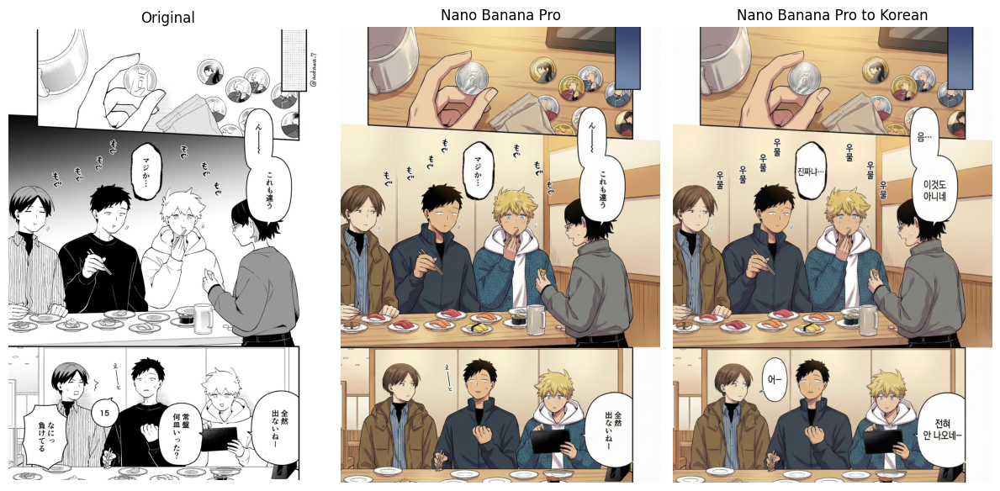

In [10]:
# Define 3 image paths
img_path1 = "data/pixiv1/original/136886858_p7.png"
img_path2 = "data/pixiv1/nbp-base/p7_38s.png"
img_path3 = "data/pixiv1/nbp-base-kr/p7_31s.png"

# Load images
img1 = Image.open(img_path1)
img2 = Image.open(img_path2)
img3 = Image.open(img_path3)

# Display 3 images in a 1x3 grid
fig, axes = plt.subplots(1, 3, figsize=(12, 6))

axes[0].imshow(img1)
axes[0].set_title("Original")
axes[0].axis('off')

axes[1].imshow(img2)
axes[1].set_title("Nano Banana Pro")
axes[1].axis('off')

axes[2].imshow(img3)
axes[2].set_title("Nano Banana Pro to Korean")
axes[2].axis('off')

plt.tight_layout()
plt.show()

Processing log files: 25it [00:00, 2575.47it/s]


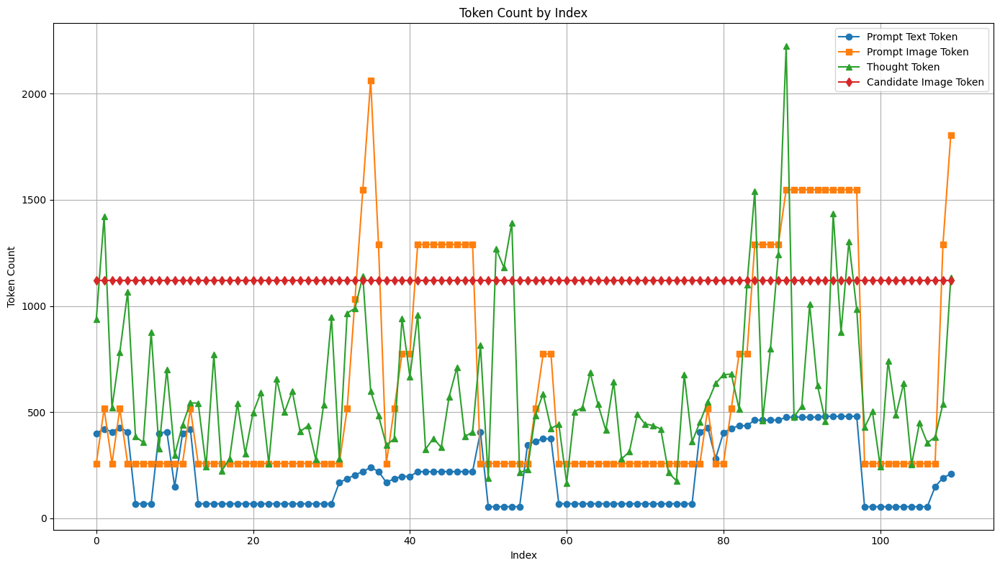


=== DataFrame ===


,prompt_txt_token_cnt,prompt_img_token_cnt,thought_token_cnt,candidate_img_token_cnt,total_token_cnt,prompt_txt_token_price,prompt_img_token_price,thought_token_price,candidate_img_token_price,total_token_price
0,400,258,938,1120,2716,0.000800,0.000516,0.011256,0.1344,0.146972
1,420,516,1422,1120,3478,0.000840,0.001032,0.017064,0.1344,0.153336
2,407,258,520,1120,2305,0.000814,0.000516,0.006240,0.1344,0.141970
3,427,516,782,1120,2845,0.000854,0.001032,0.009384,0.1344,0.145670
4,407,258,1066,1120,2851,0.000814,0.000516,0.012792,0.1344,0.148522
...,...,...,...,...,...,...,...,...,...,...
105,54,258,448,1120,1880,0.000108,0.000516,0.005376,0.1344,0.140400
106,54,258,355,1120,1787,0.000108,0.000516,0.004260,0.1344,0.139284
107,148,258,382,1120,1908,0.000296,0.000516,0.004584,0.1344,0.139796
108,190,1290,539,1120,3139,0.000380,0.002580,0.006468,0.1344,0.143828



=== Statistics (Mean and Standard Deviation) ===


,Mean,Std,Sum
prompt_txt_token_cnt,207.563636,162.635323,22832.000000
prompt_img_token_cnt,602.781818,511.575232,66306.000000
thought_token_cnt,611.954545,348.878765,67315.000000
candidate_img_token_cnt,1120.000000,0.000000,123200.000000
total_token_cnt,2542.300000,836.150754,279653.000000
prompt_txt_token_price,0.000415,0.000325,0.045664
prompt_img_token_price,0.001206,0.001023,0.132612
thought_token_price,0.007343,0.004187,0.807780
candidate_img_token_price,0.134400,0.000000,14.784000
total_token_price,0.143364,0.004862,15.770056


In [5]:
import pandas as pd
import json
import matplotlib.pyplot as plt
from pathlib import Path
from tqdm import tqdm

# 로그 디렉토리 경로
logs_dir = Path("/Users/jzahnny/code/yonsei/deeplearning/colorization/python/data/logs")

# 데이터를 저장할 리스트
data = []

# 모든 JSON 파일 처리
for json_file in tqdm(logs_dir.glob("*.json"), desc="Processing log files"):
    with open(json_file, 'r') as f:
        log_data = json.load(f)
    
    # 각 req-res 쌍 처리
    for key, value in log_data.items():
        # 에러가 없는 정상 응답만 처리
        if 'res' in value and 'error' not in value['res']:
            res = value['res']
            
            # usageMetadata에서 토큰 정보 추출
            if 'usageMetadata' in res:
                usage = res['usageMetadata']
                
                # 토큰 카운트 추출
                prompt_txt_token_cnt = 0
                prompt_img_token_cnt = 0
                
                if 'promptTokensDetails' in usage:
                    for detail in usage['promptTokensDetails']:
                        if detail['modality'] == 'TEXT':
                            prompt_txt_token_cnt = detail['tokenCount']
                        elif detail['modality'] == 'IMAGE':
                            prompt_img_token_cnt = detail['tokenCount']
                
                thought_token_cnt = usage.get('thoughtsTokenCount', 0)
                
                candidate_img_token_cnt = 0
                if 'candidatesTokensDetails' in usage:
                    for detail in usage['candidatesTokensDetails']:
                        if detail['modality'] == 'IMAGE':
                            candidate_img_token_cnt = detail['tokenCount']

                total_token_cnt = (prompt_txt_token_cnt + prompt_img_token_cnt +
                                   thought_token_cnt + candidate_img_token_cnt)
                
                # 가격 계산 (1M 토큰당)
                prompt_txt_token_price = (prompt_txt_token_cnt / 1_000_000) * 2
                prompt_img_token_price = (prompt_img_token_cnt / 1_000_000) * 2
                thought_token_price = (thought_token_cnt / 1_000_000) * 12
                candidate_img_token_price = (candidate_img_token_cnt / 1_000_000) * 120
                total_token_price = (prompt_txt_token_price + prompt_img_token_price +
                                     thought_token_price + candidate_img_token_price)
                
                data.append({
                    'prompt_txt_token_cnt': prompt_txt_token_cnt,
                    'prompt_img_token_cnt': prompt_img_token_cnt,
                    'thought_token_cnt': thought_token_cnt,
                    'candidate_img_token_cnt': candidate_img_token_cnt,
                    'total_token_cnt': total_token_cnt,
                    'prompt_txt_token_price': prompt_txt_token_price,
                    'prompt_img_token_price': prompt_img_token_price,
                    'thought_token_price': thought_token_price,
                    'candidate_img_token_price': candidate_img_token_price,
                    'total_token_price': total_token_price
                })

# DataFrame 생성
df = pd.DataFrame(data)

# 토큰 카운트 꺾은선 그래프
plt.figure(figsize=(14, 8))
plt.plot(df.index, df['prompt_txt_token_cnt'], marker='o', label='Prompt Text Token')
plt.plot(df.index, df['prompt_img_token_cnt'], marker='s', label='Prompt Image Token')
plt.plot(df.index, df['thought_token_cnt'], marker='^', label='Thought Token')
plt.plot(df.index, df['candidate_img_token_cnt'], marker='d', label='Candidate Image Token')
plt.xlabel('Index')
plt.ylabel('Token Count')
plt.title('Token Count by Index')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# 평균과 표준편차 계산
stats_df = pd.DataFrame({
    'Mean': df.mean(),
    'Std': df.std(),
    'Sum': df.sum()
})

# 결과 출력
print("\n=== DataFrame ===")
display(df)

print("\n=== Statistics (Mean and Standard Deviation) ===")
display(stats_df)